# Combinging Camera and Lidar

## 1. Lidar-to-Camera Point Projection

### a) Displaying and Cropping Lidar Points
In this section, we will load a set of Lidar points from file and display it from a top view perspective. Also, we will manually remove points that are located in the road surface. This is an important step which is needed to correctly compute the time-to-collision in the final project. The Lidar points have been obtained using a Velodyne HDL-64E sensor spinning at a frequency of 10Hz and capturing approximately 100k points per cycle. Further information on the KITTI sensor setup can be found here : http://www.cvlibs.net/datasets/kitti/setup.php

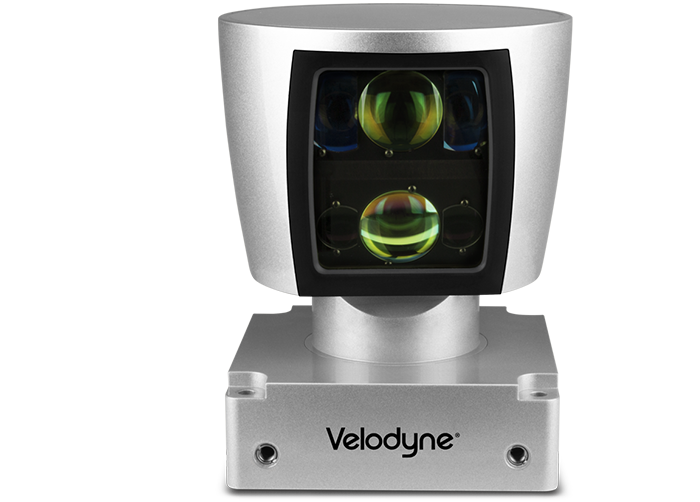

As will be detailed later, the Velodyne sensor has been synchronized with a forward-looking camera, which, at the time of capturing the Lidar data used in this section, was showing the following (by now very familiar) scene.

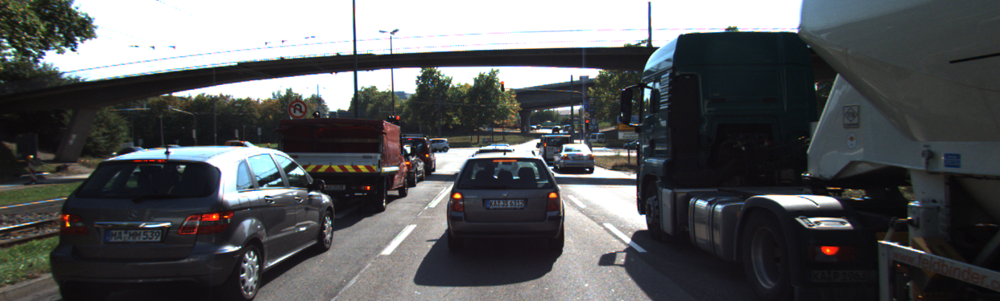

The Lidar points corresponding to the scene are displayed in the following figure, together with the Velodyne coordinate system and a set of distance markers. While the top view image has been cropped at 20m, the farthest point for this scene in the original dataset is at ~78m.

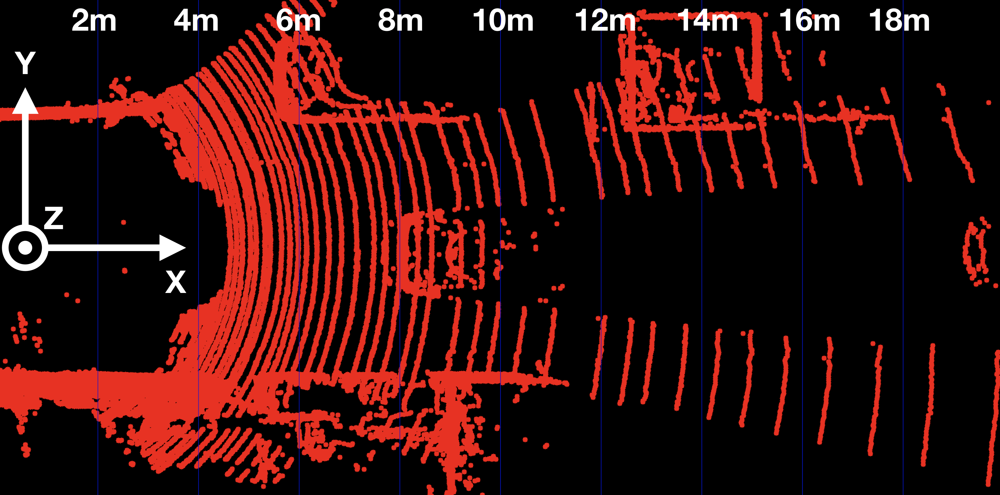

#### Exercise
The following code in `show_lidar_top_view.cpp` loads and displays the Lidar points in a top view perspective. When you run the code example, you will see that all Lidar points are displayed, including the ones on the road surface. Please complete the following exercises before continuing:

1. Change the color of the Lidar points such that X=0.0m corresponds to red while X=20.0m is shown as green with a gradual transition in between. The output of the Lidar point cloud should look like this:

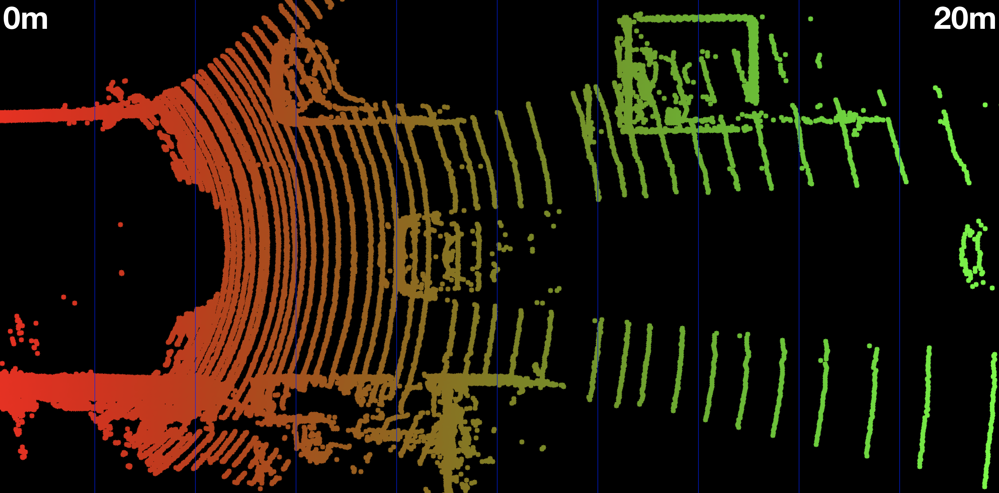

2. Remove all Lidar points on the road surface while preserving measurements on the obstacles in the scene. Your final result should look something like this:

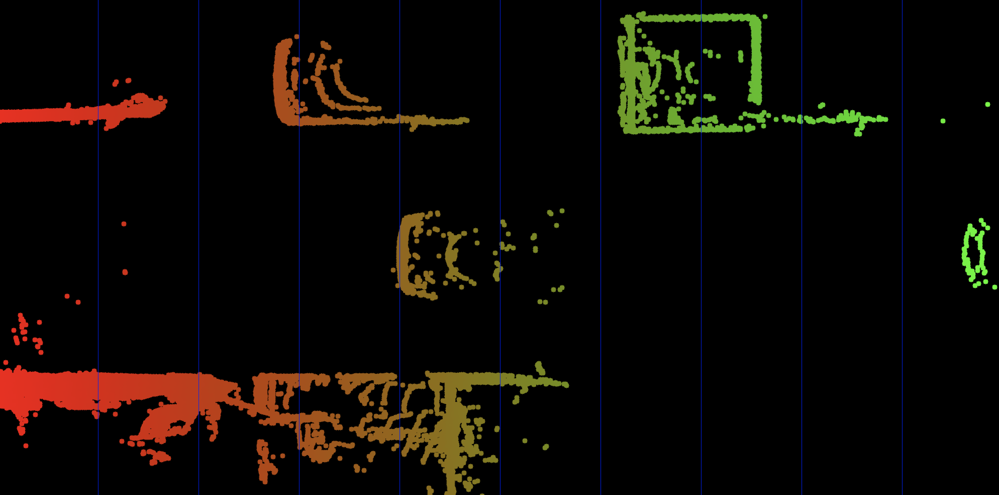

#### Solution

> see in folder `lidar_to_camera`

Now that we can display Lidar data as 3D points in the sensor coordinate system, let us move on to the next section, where we want to start working on a way to project these points into the camera image.

### 2. Homogeneous coordinates
In this section, our goal is to project points from 3D space onto the image plane. In order to do this, we can use the equations discussed in lesson 1 of this course:

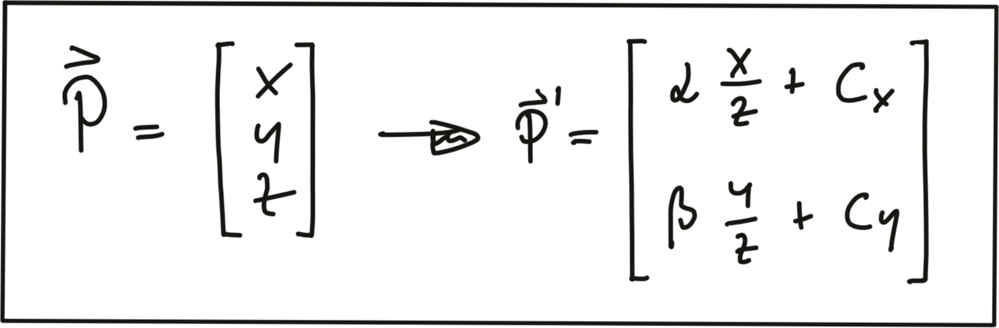

In addition to the intrinsic camera parameters which make up the geometry of the projection, we need additional information about the position and alignment of both camera and Lidar in a common reference coordinate system. To move from Lidar to camera involves translation and rotation operations, which we need to apply to every 3D point. So our goal here is to simplify the notation with which we can express the projection. Using a linear transformation (or mapping), 3D points could be represented by a vector and operations such as translation, rotation, scaling and perspective projection could be represented as matrices by which the vector is multiplied. The problem with the projection equations we have so far is that they involve a division by Z, which makes them non-linear and thus prevents us from transforming them into the much more convenient matrix-vector form.

A way to avoid this problem is to change the coordinate system and go from the original **Euclidean coordinate system** to a form called the ***Homogenous coordinate system***. Moving back and forth between both coordinate systems is a non-linear operation, but once we are in the homogenous coordinate system, projective transformations such as the one given above become linear and can thus be expressed as simple matrix-vector multiplications. Transformations between both coordinate systems work as shown in the following figure.

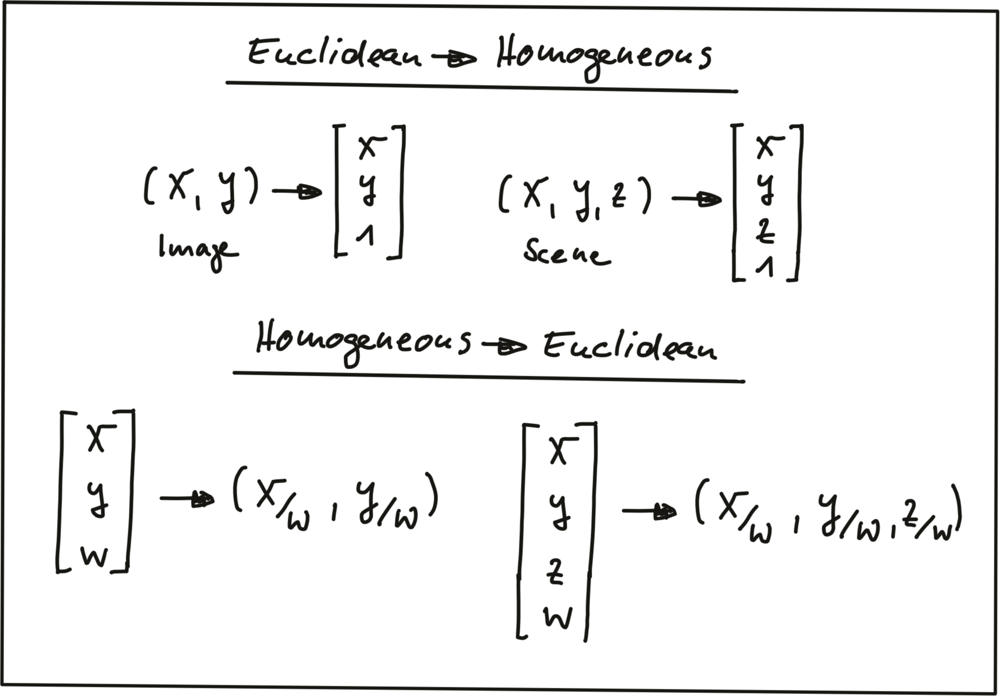

A point in the n-dimensional euclidian coordinate system is represented by a vector with n components. The transformation into (n+1)-dimensional homogeneous coordinates can be achieved by simply adding the number 1 as an additional component. The transformation can be applied to both image coordinates as well as scene coordinates.

Converting back from homogeneous coordinates to Euclidean then works by suppressing the last coordinate and dividing the first n coordinates by the (n+1)-th coordinate as shown in the figure above. As discussed earlier in this section, this is a non-linear operation and once we are back in Euclidean space, the neat separation of the different parameters into individual matrix components is lost. In the following, we will take a look at those matrix components.

### 3. Intrinsic Parameters
Now we are ready to express the projection equations in matrix-vector form:

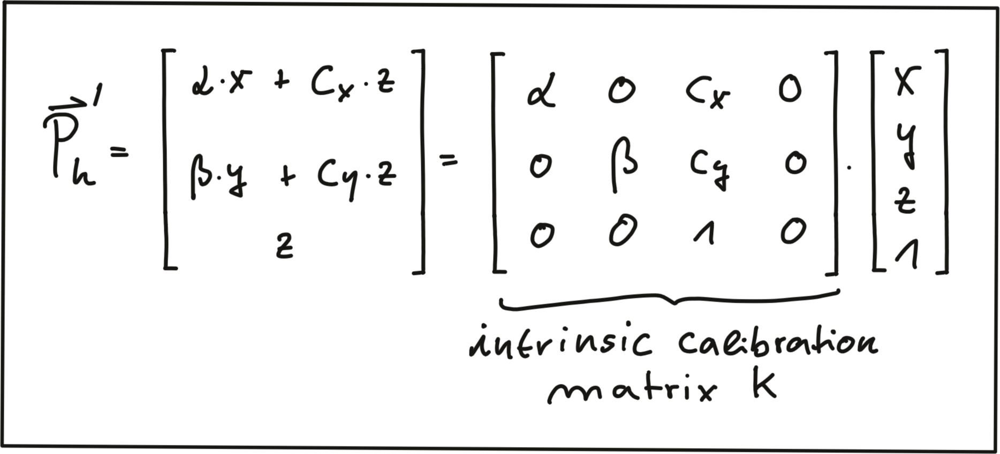

As can be seen, the camera parameters are arranged in a matrix, which conveniently expresses the properties of our pinhole camera model in a compact way. Additional properties of a more complex camera model such as ***skewness*** or ***shear*** can easily be added. The following video animation shows the effect of the individual intrinsic parameters of the camera on the appearance of objects on the image plane. [source: http://ksimek.github.io/2013/08/13/intrinsic]

* Focal Length: FoV, size of the object in the image
* Axis Skew: the parallelogram skewing of the image shape
* x_0: horizontal shear/displacement
* y_0: vertical shear/displacement

### 4. Extrinsic Parameters
The mapping between a point P in 3D space to a point P’ in the 2D image plane has so far been described in the camera coordinate system with the pinhole as its center . But what if the information we have about points in 3D (or in general about any physical object) is available in another coordinate system, such as the vehicle coordinate system common in many automotive applications? As shown in the figure below, the origin of the vehicle coordinate system is placed directly on the ground below the midpoint of the rear axle with the x-axis pointing into driving direction. In addition to the axis naming convention, the figure also shows the typically used names for rotation around X, Y and Z which are 'roll', 'pitch' and 'yaw'.

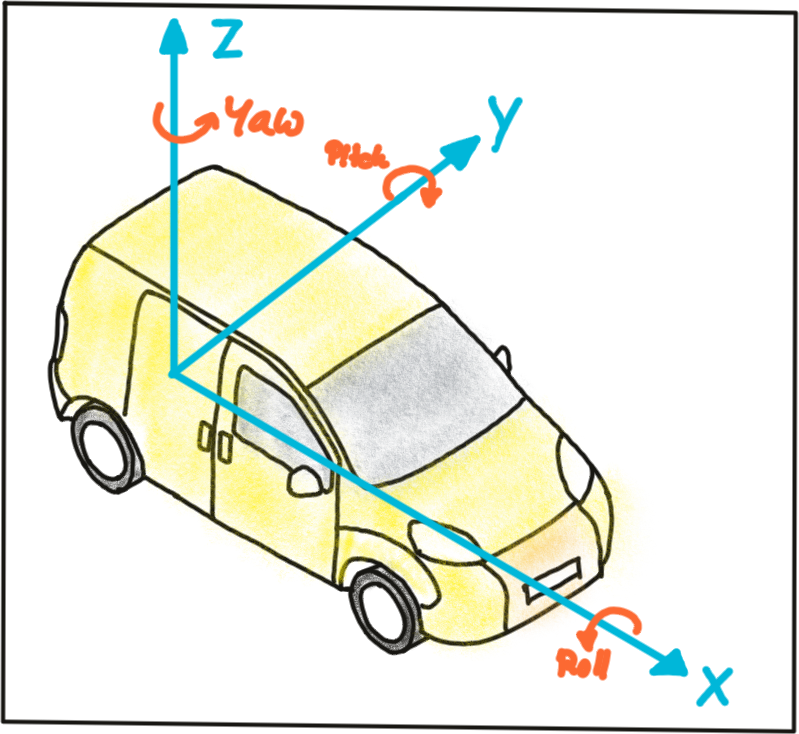

Let us assume the vehicle were equipped with a Lidar sensor and a camera, who would both be calibrated in the vehicle coordinate system. In order to project points measured in the Lidar sensor coordinate system into the camera, we need to add an additional transformation to our mapping operation that allows us to relate points from the vehicle coordinate system to the camera coordinate system and vice versa. Generally, such a mapping operation can be broken down into three components: **translation**, **rotation** and **scaling**. Let’s look at each of them in turn:

**Translation** : As seen in the following figure, translation describes the linear shift of a point P⃗ to a new location P⃗' by adding the components of a translation vector t⃗ to the components of P⃗.

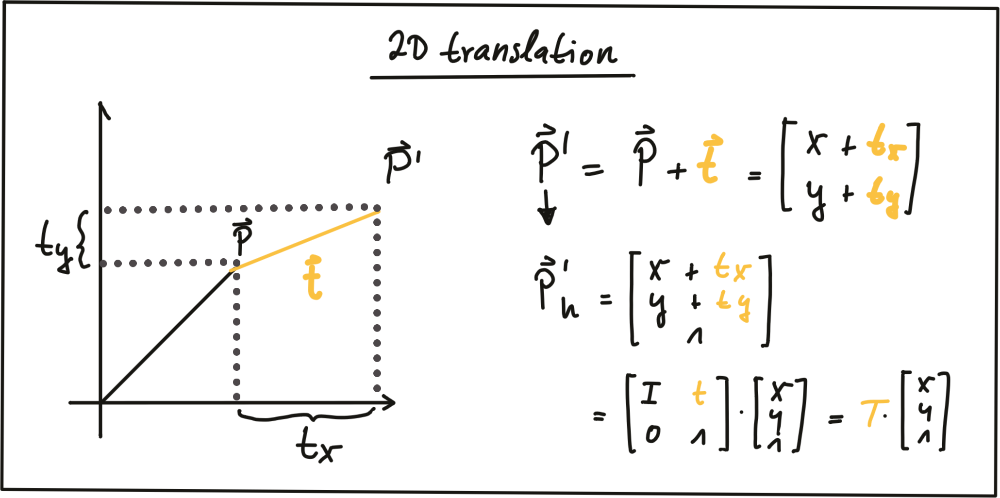

In homogeneous coordinates, this can be expressed by concatenating an identity matrix I of size N (where span class="mathquill">N is the number of components in P⃗) and the translation vector t⃗. The translation operation then becomes a simple matrix-vector multiplication as shown in the figure above.

**Scale** : While translation involves adding a translation vector t⃗ to the components of P⃗, scaling works by multiplying the components with a scale vector s⃗ instead. In homogeneous coordinates, this can be expressed as a matrix-vector multiplication as seen in the figure below.

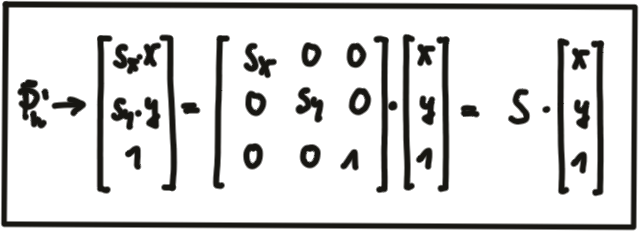

**Rotation** : A point P⃗' is rotated in counter-clockwise direction (mathematically positive) by using the following equations for x and y.

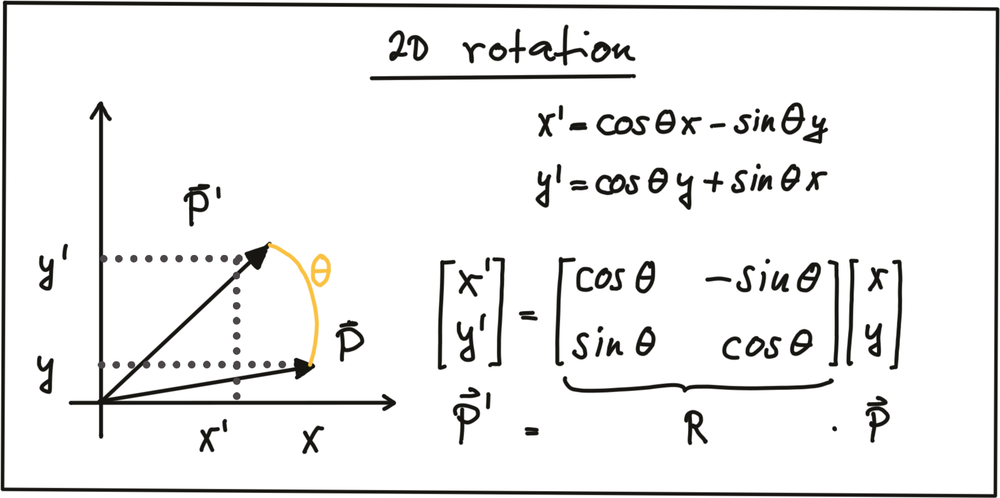

As before, the operation can be expressed as a matrix-vector multiplication with R being called the 'rotation matrix'. In 3D space, a point P can be rotated around all three axes using the following rotation matrices:

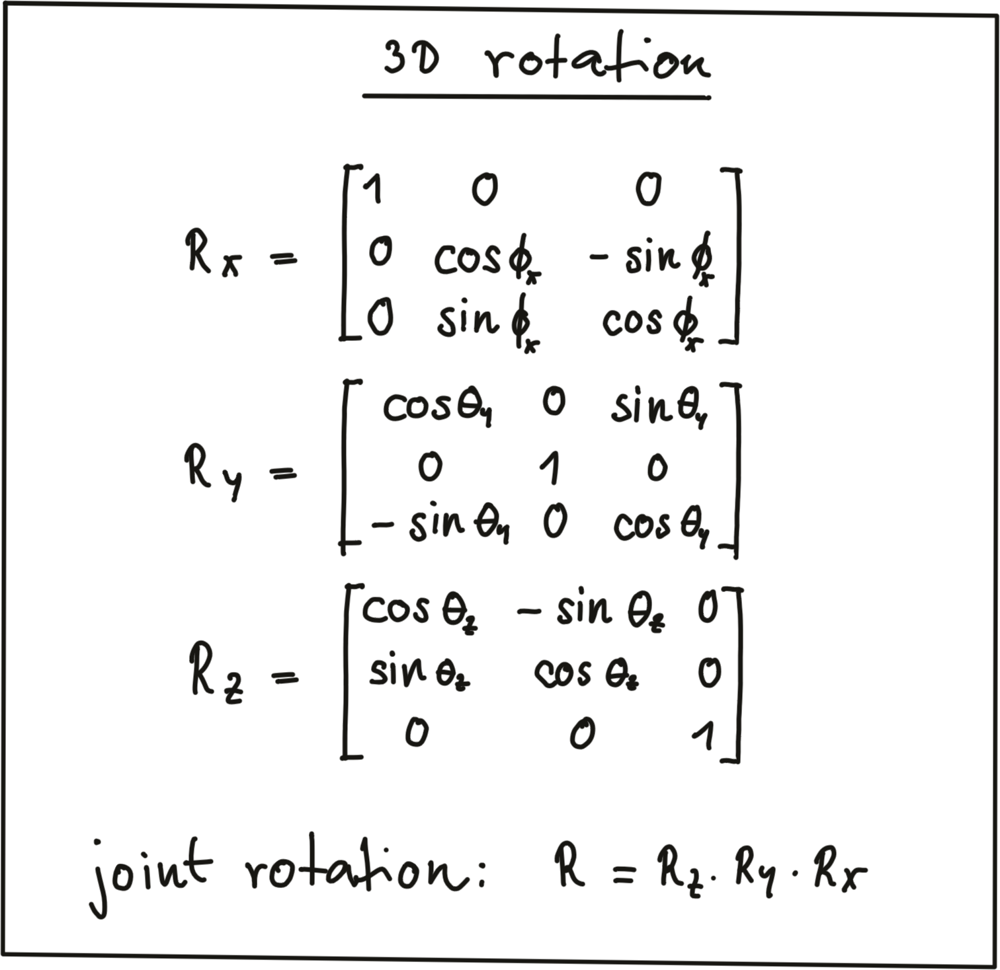

Note that the three individual rotations can be combined into a joint rotation matrix R by successive application in the order R = Rz⋅Ry⋅Rx

One of the advantages of homogeneous coordinates is that they allow for an easy combination of multiple transformations by concatenating several matrix-vector multiplications.

The combined matrix consisting of R and t⃗ is also referred to as the extrinsic matrix, as it models how points are transformed between coordinate system. Once a point in the Lidar coordinate system has been expressed in camera coordinates, we need to project it onto the image plane. For this purpose, we need to additionally integrate the intrinsic parameters discussed above. With homogeneous coordinates, we can simply do this by concatenating the individual matrices in the following manner:

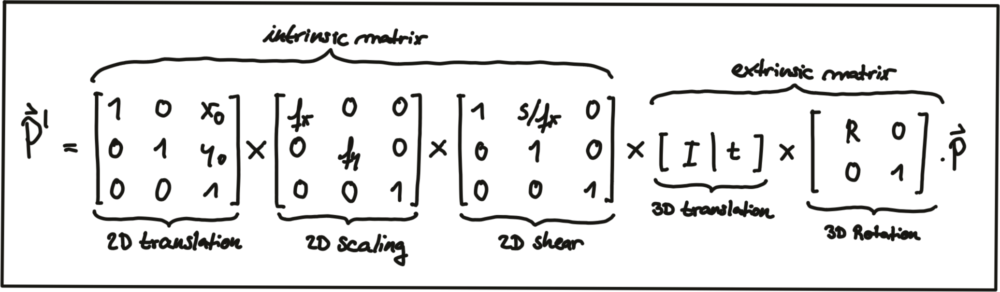

Note that the scale component has been integrated into the intrinsic matrix KK (with the focal length being the relevant parameter) and is no longer part of the extrinsic matrix. In the following video, the influence of the extrinsic parameters on the appearance of an object on the image plane is simulated. [source: http://ksimek.github.io/perspective_camera_toy.html]

### 5. Overview of the KITTI sensor setup
Now that we have an understanding of how points in 3D space can be projected onto the image plane of a camera, let us take a look at the sensor setup of the KITTI vehicle that was used to generate the data sequences. In the following figure, the vehicle is shown, equipped with two forward-facing cameras, a roof-mounted Velodyne Lidar as well as an inertial measurement unit or IMU (which we will not be using in this course).

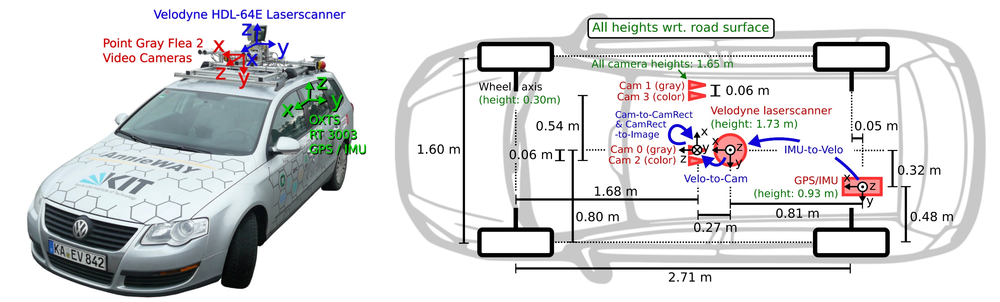

For all datasets, calibration files with intrinsic and extrinsic parameters are available once you download them from the KITTI website. In the following, the content of the file "calib_velo_to_cam.txt“ is shown, which relates the Velodyne sensor and the left camera of the stereo rig (valid for the highway sequence we are using):

```
calib_time: 15-Mar-2012 11:37:16

R: 7.533745e-03 -9.999714e-01 -6.166020e-04 1.480249e-02 7.280733e-04 -9.998902e-01 9.998621e-01 7.523790e-03 1.480755e-02

T: -4.069766e-03 -7.631618e-02 -2.717806e-01

…
```

The matrices R and T provide us with the extrinsic parameters of the sensor setup. As we know, we also need information about the intrinsic parameters in order to perform the projection. These are stored in the file "calib_cam_to_cam.txt", which is given as an excerpt in the following:

```
calib_time: 09-Jan-2012 13:57:47

…

R_rect_00: 9.999239e-01 9.837760e-03 -7.445048e-03 -9.869795e-03 9.999421e-01 -4.278459e-03 7.402527e-03 4.351614e-03 9.999631e-01

P_rect_00: 7.215377e+02 0.000000e+00 6.095593e+02 0.000000e+00 0.000000e+00 7.215377e+02 1.728540e+02 0.000000e+00 0.000000e+00 0.000000e+00 1.000000e+00 0.000000e+00

…
```

The matrix `R_rect_00` is the 3x3 rectifying rotation to make image planes co-planar, i.e. to align both cameras of the stereo rig (there are two Point Gray cameras in the KITTI vehicle) in a way that one row of pixels in the left camera directly corresponds to another row of pixels in the right camera (as opposed to a slanted line crossing over the image plane). As we are focussing on the mono camera here, we did not go into details on the underlying concepts - but If you want to learn more about this, research "***epipolar geometry***". The matrix `P_rect_00` contains the intrinsic camera parameters as discussed above (we called it K). The following equation shows how to project a 3D Lidar point X in space to a 2D image point Y (using the notation in the Kitti readme file) on the image plane of the left camera using homogeneous coordinates:

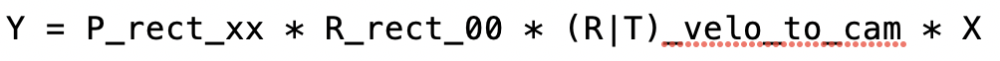

### 6. Exercise: Projecting Lidar Points into the Camera

In the code sample in `project_lidar_to_camera.cpp` of the workspace above, a framework for projecting Lidar points has been prepared. Please use your new knowledge to complete the following exercises:

1. In the loop over all Lidar points, convert each 3D point into homogeneous coordinates and store it in a 4D variable X.
2. Then, apply the projection equation as detailed in lesson 5.1 to map X onto the image plane of the camera. Store the result in Y.
3. Once this is done, transform Y back into Euclidean coordinates and store the result in the variable pt.

Once you have completed all three steps, the output of the code sample should look like the figure below.

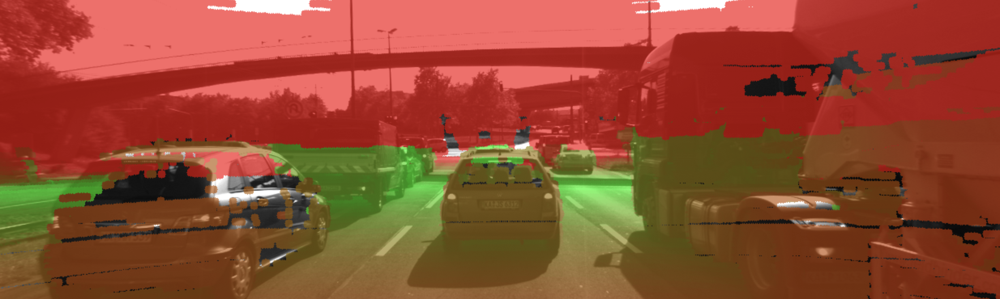

Cleary, something is not working here. The idea of coloring the individual pixels was that red should represent close 3D points while green should be used for far-away points. The image looks good up until the horizon is reached. The bright red sky is not correct though. So let’s take a look at what is wrong here.

### 7. Filtering Lidar Points
Earlier on in this section, you learned how to convert the Lidar point cloud into a top view perspective. The conversion process implicitly assumed that we would only be interested in points directly in front of the vehicle. In the code, the following lines show how the conversion into the top view image was performed:

```c++
int y = (-xw * imageSize.height / worldSize.height) + imageSize.height;
int x = (-yw * imageSize.height / worldSize.height) + imageSize.width / 2;
```

As you now know, the Velodyne Lidar is roof-mounted and spins in a 360° circle at 10 Hz. That means, it also measures 3D points behind the vehicle facing away from the camera. Those points are also contained in the data set but they do not show up in the top view image. But when projected into the camera, they produce a valid image plane coordinate, even though they are not visible to the camera (the projecting line intersects the image plane from behind). The associated Lidar points have a negative x-coordinate which causes the respective pixel color to appear in red on the image plane. So in order to avoid this from happening, let’s take a look at some filtering options we have to thin out the point cloud.

The code below shows how a filter can be applied to remove Lidar points that do not satisfy a set of constraints, i.e. they are …

1. … positioned behind the Lidar sensor and thus have a negative x coordinate.
2. … too far away in x-direction and thus exceeding an upper distance limit.
3. … too far off to the sides in y-direction and thus not relevant for collision detection
4. … too close to the road surface in negative z-direction.
5. … showing a reflectivity close to zero, which might indicate low reliability.

```c++
 for(auto it=lidarPoints.begin(); it!=lidarPoints.end(); ++it)
 {
    float maxX = 25.0, maxY = 6.0, minZ = -1.4; 
    if(it->x > maxX || it->x < 0.0 || abs(it->y) > maxY || it->z < minZ || it->r<0.01 )
    {
        continue; // skip to next point
    }
...
```

After applying these filters to the Lidar point cloud, the resulting overlay image shows a significantly reduced number of points. From the perspective of collision detection, measurement quality is of highest importance and the filtering step, aside from increasing the processing speed further down the pipeline, can help improve reliability. Try this now in your `project_lidar_to_camera.cpp` file in the workspace above!

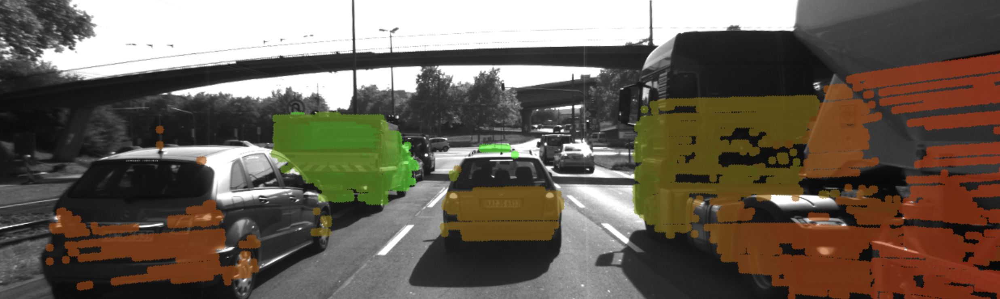


## 2. Object Detection with YOLO

## 3. Standard CV vs. Deep Learning

## 4. Creating 3D Objects